In [1]:
import os
import sys
from pathlib import Path
import yaml
import torch
import argparse
import matplotlib.pyplot as plt
from easydict import EasyDict
from pytorch_lightning import Trainer
from pytorch_lightning.loggers import WandbLogger

sys.path.append(str(Path().resolve().parent))
from train.augmentation import DataAugmentation
from train.model import EfficientLightning
from train.service import TrainWrapper
from train_wb import parse_args, get_cfg

lightning_fabric.utilities.seed: Global seed set to 1


In [48]:
from torch import tensor
from torchmetrics.classification import MultilabelAccuracy, MultilabelF1Score, MultilabelPrecision, MultilabelRecall

metric_f1 = MultilabelF1Score(num_labels=2, average='none')
metric_p = MultilabelPrecision(num_labels=2, average='none')
metric_r = MultilabelRecall(num_labels=2, average='none')
metric_acc = MultilabelAccuracy(num_labels=2, average='none')

In [50]:
target = tensor([[1, 0], [0, 1], [0, 0], [0, 0],])
preds = tensor([[1, 0], [0, 1], [0, 0], [0, 1],])

print('f1:', metric_f1(preds, target))
print('p:', metric_p(preds, target))
print('r:', metric_r(preds, target))
print('acc:', metric_acc(preds, target))

f1: tensor([1.0000, 0.6667])
p: tensor([1.0000, 0.5000])
r: tensor([1., 1.])
acc: tensor([1.0000, 0.7500])


In [49]:
target = tensor([[1, 0], [0, 1], [0, 0], [0, 1],])
preds = tensor([[1, 0], [0, 1], [0, 0], [0, 0],])

print('f1:', metric_f1(preds, target))
print('p:', metric_p(preds, target))
print('r:', metric_r(preds, target))
print('acc:', metric_acc(preds, target))

f1: tensor([1.0000, 0.6667])
p: tensor([1., 1.])
r: tensor([1.0000, 0.5000])
acc: tensor([1.0000, 0.7500])


In [51]:
target = tensor([[1, 0], [0, 1], [0, 0], [0, 1],])
preds = tensor([[1, 0], [0, 1], [0, 0], [1, 0],])

print('f1:', metric_f1(preds, target))
print('p:', metric_p(preds, target))
print('r:', metric_r(preds, target))
print('acc:', metric_acc(preds, target))

f1: tensor([0.6667, 0.6667])
p: tensor([0.5000, 1.0000])
r: tensor([1.0000, 0.5000])
acc: tensor([0.7500, 0.7500])


In [6]:
import numpy as np
import time
import random


cum1 = []
cum2 = np.zeros((0,), dtype='int32')

count = 10000

whole_time = 0
for i in range(count):
    arr1 = [random.randint(0, 1) for i in range(100)]
    start = time.time()
    cum1 += arr1
    stop = time.time()
    whole_time += stop - start
print(whole_time)

whole_time = 0
for i in range(count):
    arr1 = [random.randint(0, 1) for i in range(100)]
    arr2 = np.array(arr1, dtype='int32')
    start = time.time()
    cum2 = np.concatenate([cum2, arr2])
    stop = time.time()
    whole_time += stop - start
print(whole_time)

len(cum1), len(cum2)

0.012059211730957031
2.0842647552490234


(1000000, 1000000)

In [6]:
extra_files = {"num2label.txt": ""}  # values will be replaced with data
model = torch.jit.load(
    "/home/achernikov/CLS/epoch=18-step=12027.pt",
    "cuda",
    _extra_files=extra_files,
)

In [10]:
model(torch.randn((1, 3, 640, 640)).to('cuda'))

tensor([[-0.8996, -1.4832, -1.7575, -1.6931, -1.4566]], device='cuda:0',
       grad_fn=<AddmmBackward0>)

In [7]:
checkpoint = torch.load('/home/achernikov/CLS/DATA/models/body_type/v__6_train_eff_48_0.2/checkpoints/epoch=31-step=12320.ckpt',
                        'cuda:0')
state_dict = checkpoint['state_dict']
state_dict

OrderedDict([('model.features.0.0.weight',
              tensor([[[[-5.0355e-01, -3.5381e-02,  5.8186e-01],
                        [-9.6141e-01, -1.2213e-01,  1.1525e+00],
                        [-1.0003e+00, -1.7179e-01,  1.0464e+00]],
              
                       [[-7.7819e-01, -1.0428e-01,  7.8072e-01],
                        [-1.3028e+00, -1.7517e-01,  1.5151e+00],
                        [-1.2778e+00, -1.4485e-01,  1.4537e+00]],
              
                       [[-2.5546e-01, -5.2077e-02,  2.9821e-01],
                        [-5.7167e-01, -2.8702e-02,  8.2914e-01],
                        [-6.4182e-01, -1.9411e-01,  6.6819e-01]]],
              
              
                      [[[ 6.5986e-02,  5.9361e-02, -2.0740e-02],
                        [ 1.0514e-01, -1.3862e-03, -5.0751e-02],
                        [ 7.6555e-02, -1.3388e-03, -7.5140e-02]],
              
                       [[-2.4893e-03, -1.4582e-01, -1.2581e-01],
                        [-1.5734

In [8]:
state_dict.keys()

odict_keys(['model.features.0.0.weight', 'model.features.0.1.weight', 'model.features.0.1.bias', 'model.features.0.1.running_mean', 'model.features.0.1.running_var', 'model.features.0.1.num_batches_tracked', 'model.features.1.0.block.0.0.weight', 'model.features.1.0.block.0.1.weight', 'model.features.1.0.block.0.1.bias', 'model.features.1.0.block.0.1.running_mean', 'model.features.1.0.block.0.1.running_var', 'model.features.1.0.block.0.1.num_batches_tracked', 'model.features.1.1.block.0.0.weight', 'model.features.1.1.block.0.1.weight', 'model.features.1.1.block.0.1.bias', 'model.features.1.1.block.0.1.running_mean', 'model.features.1.1.block.0.1.running_var', 'model.features.1.1.block.0.1.num_batches_tracked', 'model.features.2.0.block.0.0.weight', 'model.features.2.0.block.0.1.weight', 'model.features.2.0.block.0.1.bias', 'model.features.2.0.block.0.1.running_mean', 'model.features.2.0.block.0.1.running_var', 'model.features.2.0.block.0.1.num_batches_tracked', 'model.features.2.0.bloc

2.1) Маски телок ставятся в случайное место на бекгроунде, маска может касаться краев бэкгроунда

2.2) Маски могут пропорционально становиться меньше, или больше, но БЕЗ растяжений по одной оси только

In [10]:
import kornia as K

img = torch.zeros((3, 10, 10), dtype=torch.float32)
K.augmentation.RandomResizedCrop((5, 5))(img).shape

torch.Size([1, 3, 5, 5])

In [2]:
args = parse_args(['--cat', 'sex_positions'])
cfg = get_cfg(args.cfg)
cfg.update(vars(args))
print(args)
WRAPPER = TrainWrapper(
    cfg=cfg,
    num_workers=32,
)

cls.train.service: Class names: {'0': '69', '1': 'cowgirl', '2': 'doggy style', '3': 'missionary', '4': 'reverse cowgirl', '5': 'spooning'}
cls.train.service: Class index of maximum weight: 0
cls.train.service: Prepare Train Subset


Namespace(cfg='/home/achernikov/CLS/classification/cfg/default.yaml', cat='sex_positions', bg_cat='background', batch_size=48, mode='train', decay=0.001, arch='eff', gray=False, vflip=True, masks=False, epochs=1, badlist_path=None, pretrained=None, gpu=1, num_workers=32)


cls.train.datasets: Foreground data contains 22224 paths. 21274 is available
cls.train.datasets: Background data contains 231 paths. 231 is available
cls.train.service: Prepare Val Subset
cls.train.datasets: Foreground data contains 5557 paths. 5466 is available
cls.train.datasets: Background data contains 231 paths. 231 is available


tensor([0., 0., 1., 0., 0., 0.], dtype=torch.float16)


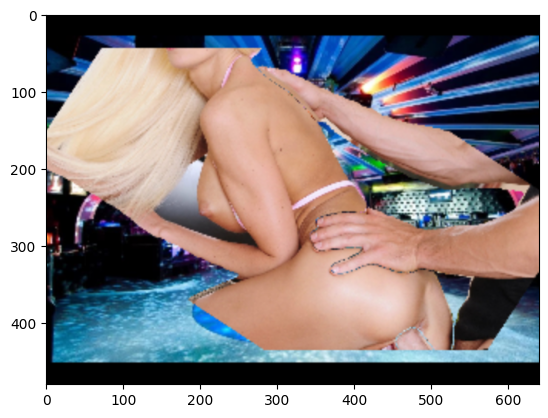

tensor([0., 0., 1., 0., 0., 0.], dtype=torch.float16)


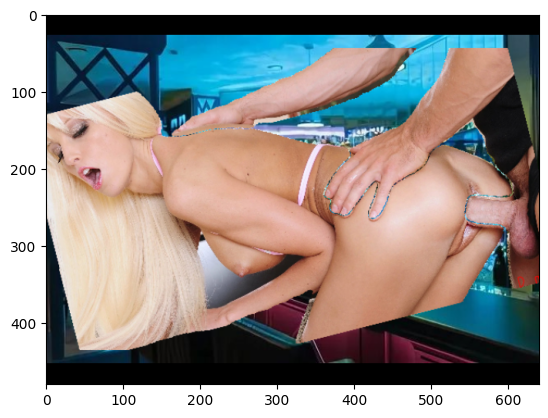

tensor([0., 0., 1., 0., 0., 0.], dtype=torch.float16)


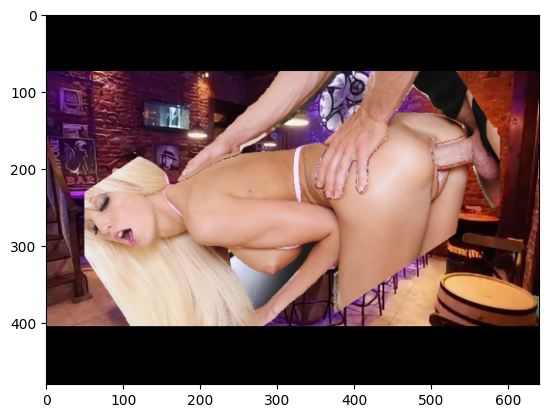

tensor([0., 0., 1., 0., 0., 0.], dtype=torch.float16)


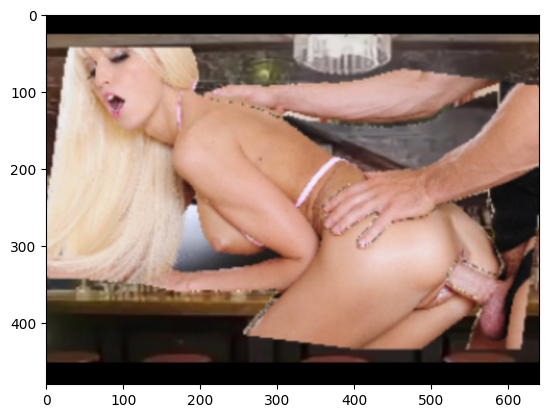

tensor([0., 0., 1., 0., 0., 0.], dtype=torch.float16)


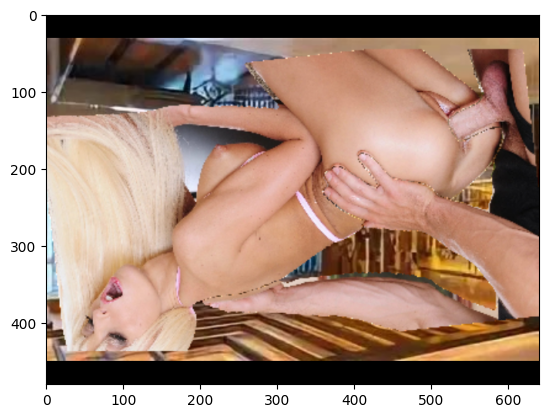

tensor([0., 0., 1., 0., 0., 0.], dtype=torch.float16)


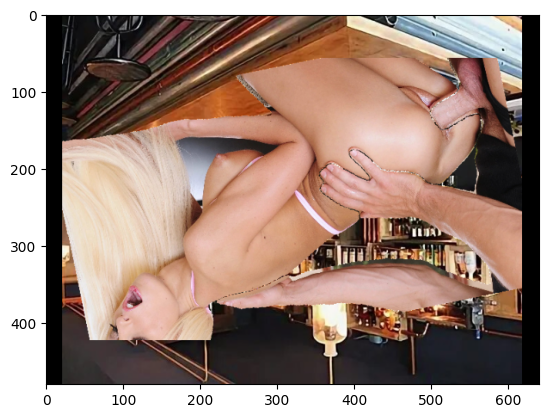

tensor([0., 0., 1., 0., 0., 0.], dtype=torch.float16)


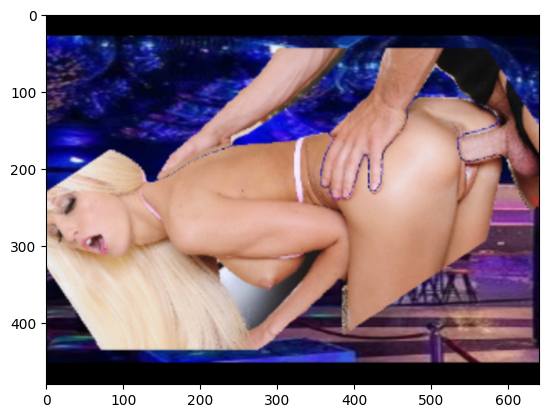

tensor([0., 0., 1., 0., 0., 0.], dtype=torch.float16)


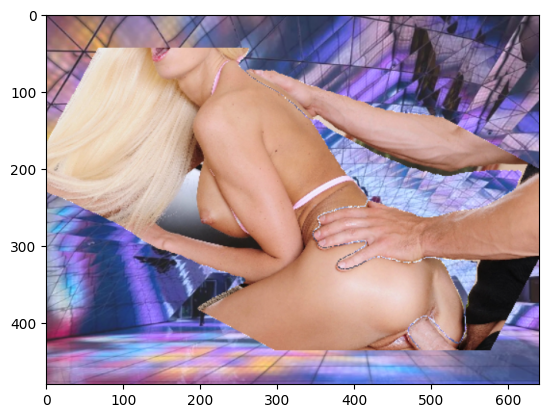

tensor([0., 0., 1., 0., 0., 0.], dtype=torch.float16)


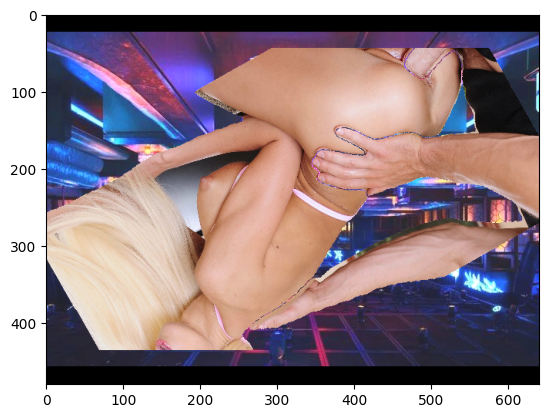

tensor([0., 0., 1., 0., 0., 0.], dtype=torch.float16)


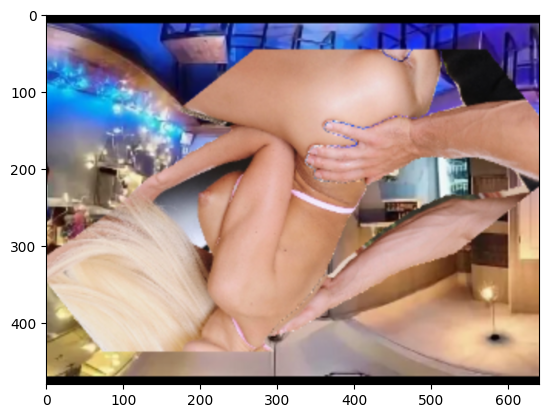

In [7]:
for i in range(10):
    img, label = WRAPPER.train_set[0]
    print(label)
    img = img.permute(1, 2, 0).float().cpu().numpy()
    plt.imshow(img)
    plt.show()
    

3.1) ЛЮБОЙ треш у нас имеет  0ое представление в форме 1-hot

20967
tensor([0., 0., 0., 0.], dtype=torch.float16)


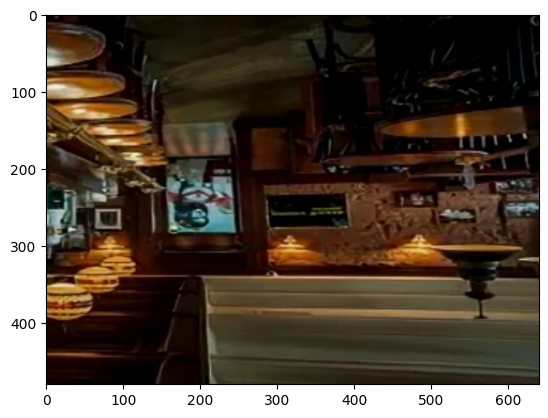

20966
tensor([0., 0., 0., 0.], dtype=torch.float16)


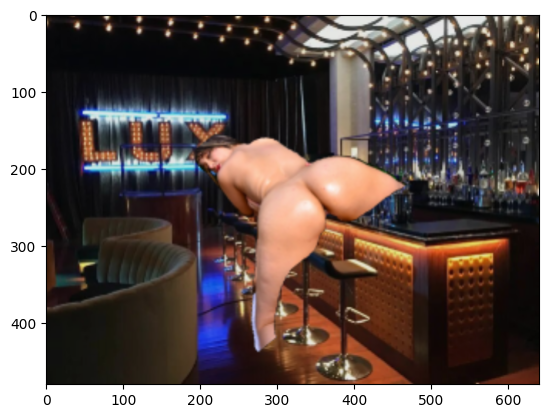

20960
tensor([0., 0., 0., 0.], dtype=torch.float16)


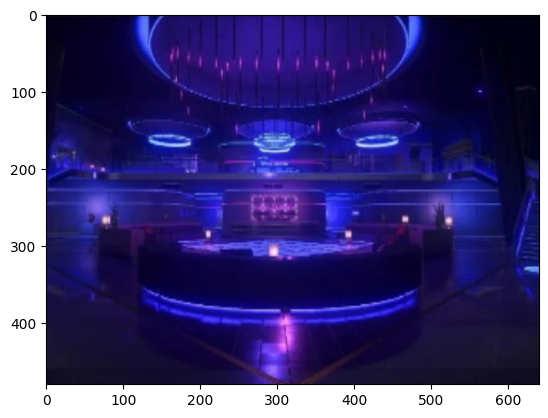

20951
tensor([0., 0., 0., 0.], dtype=torch.float16)


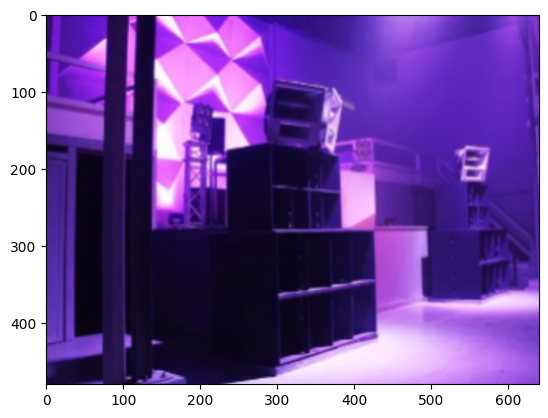

20947
tensor([0., 0., 0., 0.], dtype=torch.float16)


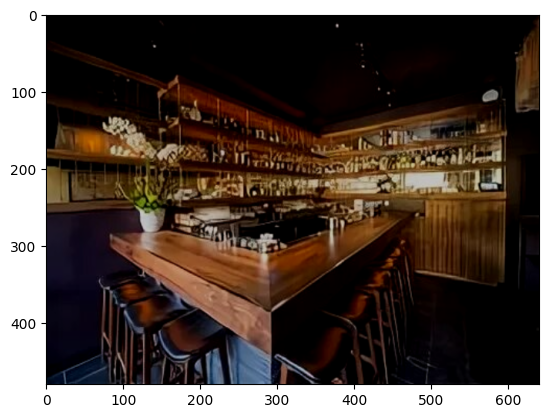

20946
tensor([0., 0., 0., 0.], dtype=torch.float16)


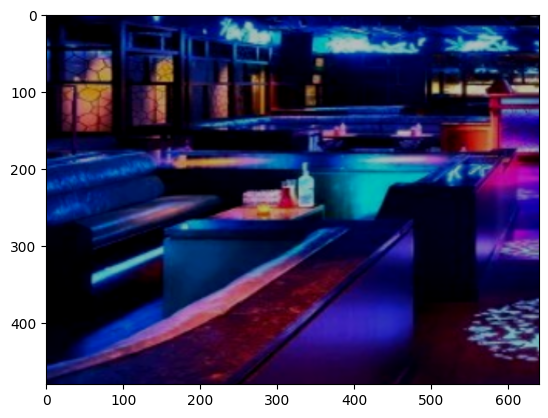

20942
tensor([0., 0., 0., 0.], dtype=torch.float16)


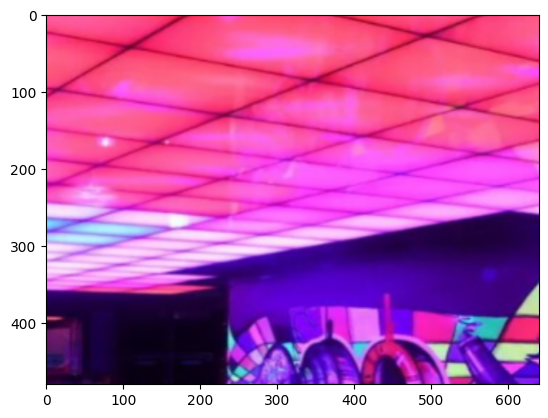

20940
tensor([0., 0., 0., 0.], dtype=torch.float16)


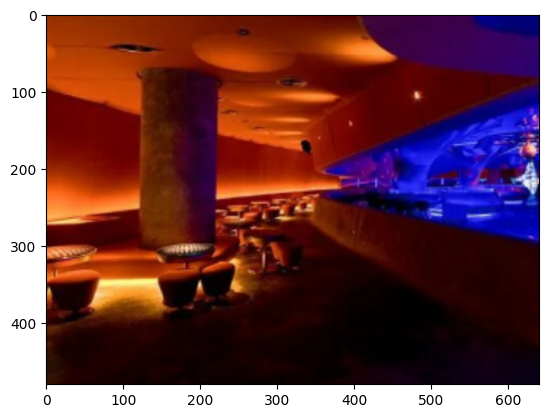

20937
tensor([0., 0., 0., 0.], dtype=torch.float16)


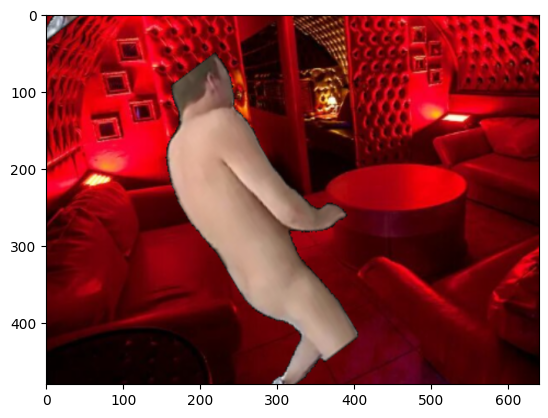

20931
tensor([0., 0., 0., 0.], dtype=torch.float16)


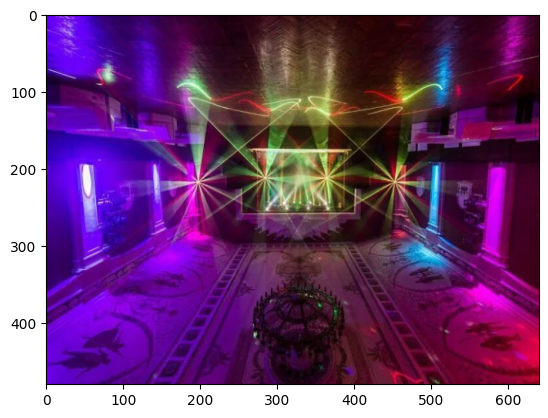

20930
tensor([0., 0., 0., 0.], dtype=torch.float16)


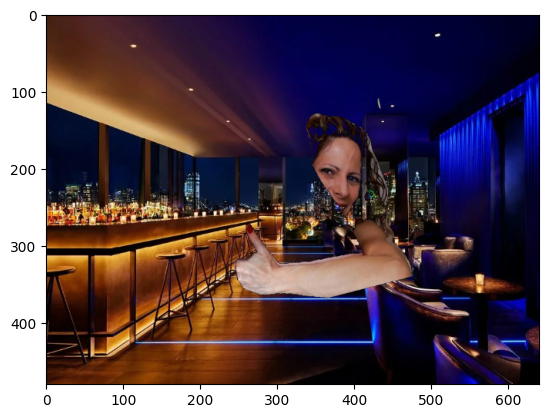

20922
tensor([0., 0., 0., 0.], dtype=torch.float16)


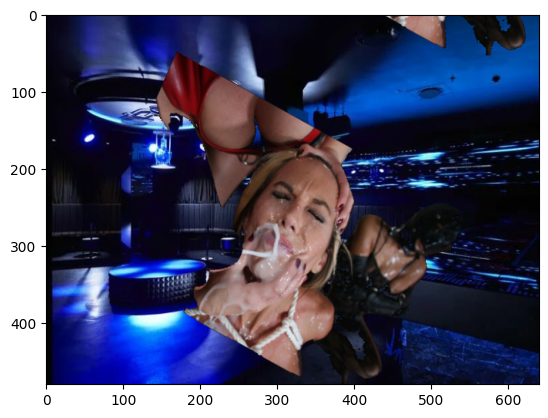

20920
tensor([0., 0., 0., 0.], dtype=torch.float16)


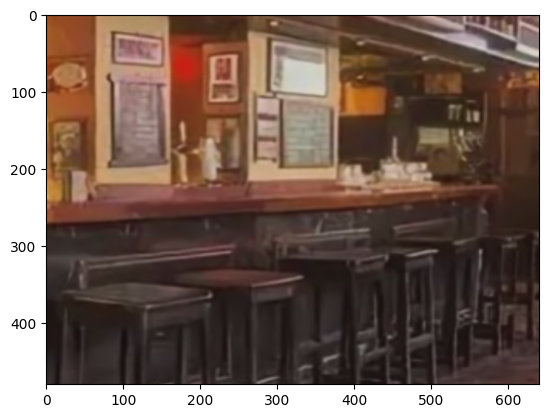

20911
tensor([0., 0., 0., 0.], dtype=torch.float16)


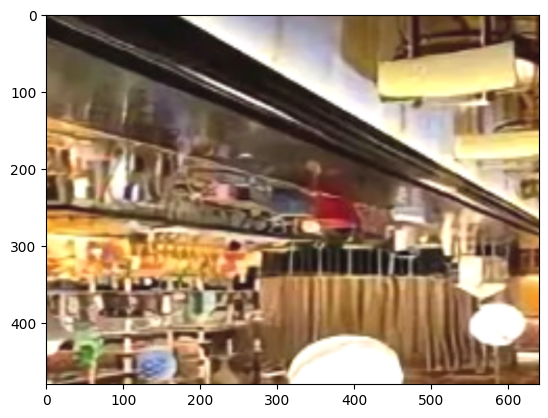

20909
tensor([0., 0., 0., 0.], dtype=torch.float16)


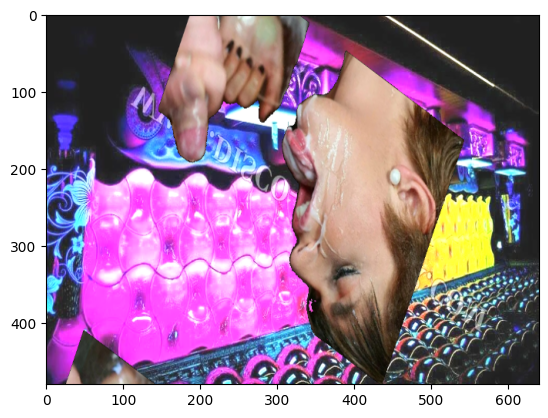

20897
tensor([0., 0., 0., 0.], dtype=torch.float16)


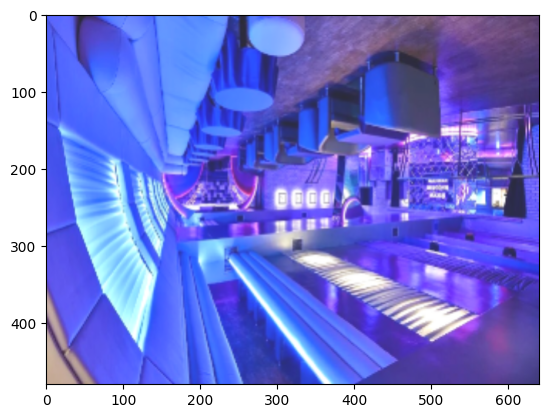

20895
tensor([0., 0., 0., 0.], dtype=torch.float16)


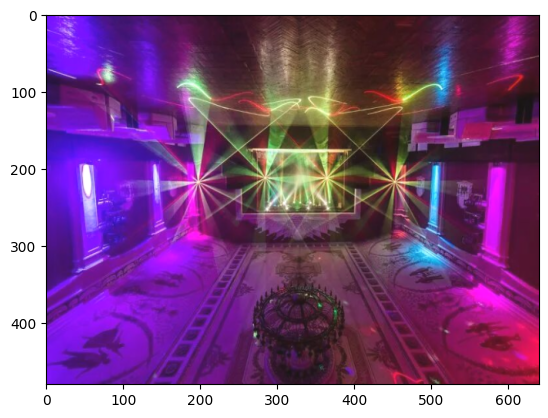

20894
tensor([0., 0., 0., 0.], dtype=torch.float16)


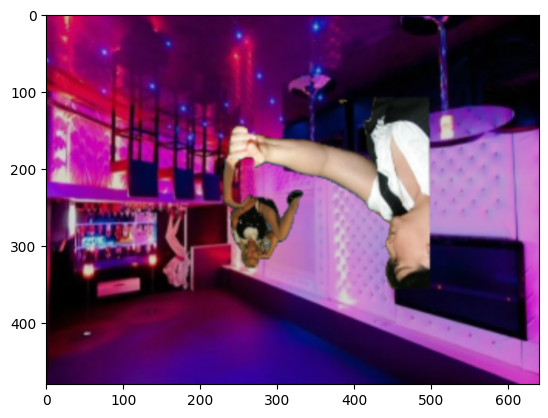

20891
tensor([0., 0., 0., 0.], dtype=torch.float16)


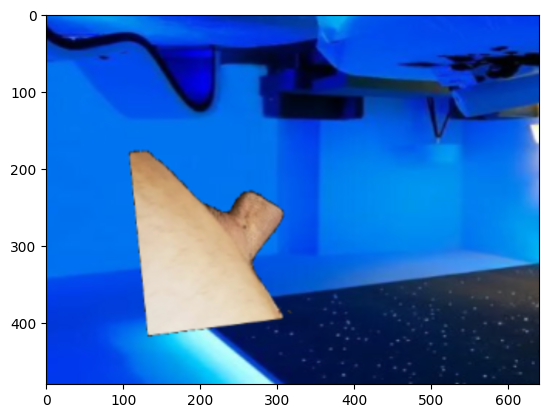

20890
tensor([0., 0., 0., 0.], dtype=torch.float16)


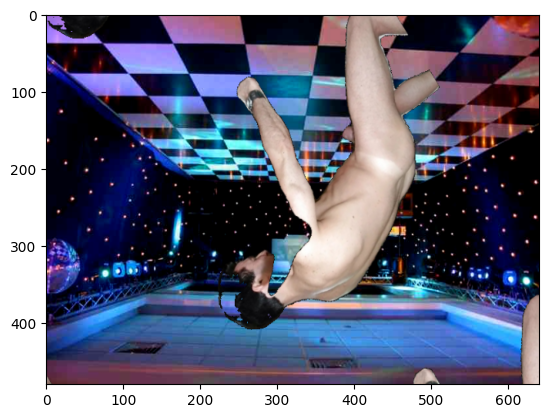

20885
tensor([0., 0., 0., 0.], dtype=torch.float16)


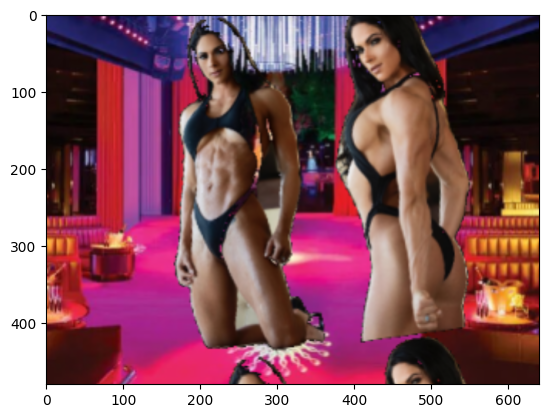

In [7]:
import numpy as np

cnt = 0
for i in range(len(WRAPPER.train_set) - 1, -1, -1):
    elem = WRAPPER.train_set[i]
    img, label = elem
    if label.sum() != 0:
        continue
    print(i)
    print(label)
    img = img.permute(1, 2, 0).float().cpu().numpy()
    plt.imshow(img)
    plt.show()
    
    cnt += 1
    if cnt > 20:
        break